In [2]:
# Importing all the necessary librarires 

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline 

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import precision_score, recall_score, f1_score
# from sklearn.metrics import plot_roc_curve
from sklearn.preprocessing import LabelEncoder


In [ ]:
df = pd.read_csv("./train.csv")
df.head()

In [ ]:
df.describe()

* Here only the numerical columns are being displayed, even though there are numeric entries in the form of string in many other columns

In [ ]:
# Let's find the null values in the dataset
df.isna().sum()

In [ ]:
df.shape

In [ ]:
df["Customer_ID"].nunique()

In [9]:
sns.pairplot(df)

* As we can see there are 1 Lakhs rows and 28 columns in our dataset
* We need to do data cleaning and remove/replace the null values, outlier values and negative values from the dataset, before creating any machine learning model
* Our dataset might also contains noisy dataset like, blank or cryptice hash values, we also need to check and replace those values 

* On examining the dataset we can see that, it contains data of customer for the months of January to August
* Each customer is represented using unique customer_ID
* We can use that customer_ID during data cleaning to find some insights and also deal with the negative, outlier or null values

* We are going to incorporate mainly 2 methods or functions namely, Mode_method and outlier_removal

* Mode_method will group the data, according to the customer_id and see for the missing values
* The features like age,ssn,occupation,annual_incom,etc. will remain same and constant for a particular person
* Hence we can use the same value for all the rows of a particular customer
* We will identify and distinguish the customers using customer_id 
* For example customer having customer_id 5, enters his age as 34,34,34,3,34,nan,-4,34 respectively in the 8 rows assigneed per customer
* So here we will take the mode of the age column for that particular customer and replace all the values with mode of that customer's age
* By doing so, the values like 3,-4 and nan will be removed and imputed with the original and correct values, which is 34 in this case

* Thus, for other columns too, we are incorporating mode_method and imputing the datast with the most frequent value entered by the customer
* As a human might have entered incorrect value in one of the 8 rows 

In [ ]:
df_no_null = df.dropna()
df_no_null.shape

* As we can see, if we remove all the rows having null values, our dataset will be reduced to around 50%, which is considered to be a significant loss, hence, we have saved huge amount of data by incorporating this custom function mode_method

* Secondly we are going to remove the outliers from the dataset by using outliers_removal function 
* As seen in the df.describe(), the maximum values found in the columns like "Num_Credit_Card" is 1499, then in column "Num_Bank_Accounts", the max value is 1798
* This high value seems false and outlier
* So we will use inter-quartile range and whisker range to find and detect the outliers in the columns
* Thus, by removing those values we will get rid of the outliers

# Data Cleaning

* Individual column wise data cleaning and removal is to be undertaken

In [ ]:
columns_ = ['Monthly_Balance','Payment_of_Min_Amount','Payment_Behaviour','Credit_History_Age',
            'Amount_invested_monthly','Credit_Utilization_Ratio','Changed_Credit_Limit','Type_of_Loan','Delay_from_due_date','Num_of_Delayed_Payment']
df1 = df.drop(columns=columns_)
columns_1 = ['ID','Customer_ID','Month']
df2 = df1.drop(columns=columns_1)
remaining_columns = df2.columns
for cuid in df1['Customer_ID'].unique():
    cuid_rows = df1[df1['Customer_ID'] == cuid]
    for i in remaining_columns:
        mode_a = cuid_rows[i].mode()
        if(df1.loc[df1['Customer_ID'] == cuid, i] != mode_a.iloc[0]).any().item():
            df1.loc[df1['Customer_ID'] == cuid, i] = mode_a.iloc[0]
df1

In [ ]:
df.update(df1)

In [ ]:
df.to_csv("C:\\Users\\satap\\OneDrive\\Desktop\\mode_df.csv",index=False)

## Num_of_Delayed_Payment

In [ ]:
column_to_process = 'Num_of_Delayed_Payment'
df[column_to_process] = df[column_to_process].str.rstrip('_')
df['Num_of_Delayed_Payment'] = pd.to_numeric(df['Num_of_Delayed_Payment'], errors='coerce')
Q1 = df['Num_of_Delayed_Payment'].quantile(0.25)
Q3 = df['Num_of_Delayed_Payment'].quantile(0.75)
IQR = Q3 - Q1
whishker_max = Q3 + 1.5*IQR
df['Num_of_Delayed_Payment'] = df['Num_of_Delayed_Payment'].apply(lambda x: 'Krutin' if pd.notna(x) and (x < 0 or x > whishker_max) else x)
df = df[df['Num_of_Delayed_Payment'] != 'Krutin']
df.head()

In [ ]:
mean_Num_of_Delayed_Payment = df.groupby('Customer_ID')['Num_of_Delayed_Payment'].mean()

df['Num_of_Delayed_Payment'] = df['Num_of_Delayed_Payment'].fillna(df['Customer_ID'].map(mean_Num_of_Delayed_Payment))
df['Num_of_Delayed_Payment']

## Changed_Credit_Limit

In [ ]:
df['Changed_Credit_Limit'] = pd.to_numeric(df['Changed_Credit_Limit'], errors='coerce')

mean_Changed_Credit_Limit = df.groupby('Customer_ID')['Changed_Credit_Limit'].mean()

df['Changed_Credit_Limit'] = df['Changed_Credit_Limit'].fillna(df['Customer_ID'].map(mean_Changed_Credit_Limit))
df['Changed_Credit_Limit']

## Monthly_Balance

In [ ]:
df['Monthly_Balance'] = pd.to_numeric(df['Monthly_Balance'], errors='coerce')

mean_monthly_balance = df.groupby('Customer_ID')['Monthly_Balance'].mean()

for cuid in df['Customer_ID'].unique():
    ind = (df['Customer_ID'] == cuid) & df['Monthly_Balance'].isnull()
    df.loc[ind, 'Monthly_Balance'] = mean_monthly_balance[cuid]

## Amount_invested_monthly

In [ ]:
df['Amount_invested_monthly'] = pd.to_numeric(df['Amount_invested_monthly'], errors='coerce')

mean_amount_invested = df.groupby('Customer_ID')['Amount_invested_monthly'].mean()

df['Amount_invested_monthly'] = df['Amount_invested_monthly'].replace('_10000_', 'NaN')
df['Amount_invested_monthly'] = df['Amount_invested_monthly'].fillna(df['Customer_ID'].map(mean_amount_invested))


## Credit_History_Age

In [ ]:
df['Credit_History_Age'] = df['Credit_History_Age'].astype(str)

for cuid in df['Customer_ID'].unique():
    subset = df[df['Customer_ID'] == cuid]
    # print(subset)
    for i in range(1, len(subset)):
      array1=[]
      current_value = subset.iloc[i]['Credit_History_Age']
      if current_value.lower() == 'nan':
        previous_value = subset.iloc[i - 1]['Credit_History_Age']
        # print(i,previous_value)
        array1 = (previous_value.split())
        # print(int(array1[3])+1)
        if array1[0].isdigit() and array1[3].isdigit():
              incremented_age = f"{int(array1[0])} Years and {int(array1[3]) + 1} Months"
              df.at[subset.index[i], 'Credit_History_Age'] = incremented_age


In [ ]:
df['Num_of_Loan'] = pd.to_numeric(df['Num_of_Loan'], errors='coerce', downcast='integer')
df['Outstanding_Debt'] = pd.to_numeric(df['Outstanding_Debt'], errors='coerce', downcast='integer')
# df['SSN'] = pd.to_numeric(df['SSN'], errors='coerce', downcast='integer')

In [ ]:
numeric_data = df.select_dtypes(include =['float','int'],exclude=['object'])
numeric_data

## Payment_of_Min_Amount

In [ ]:
df['Payment_of_Min_Amount'].replace("NM","No",inplace=True)

In [ ]:
df['Payment_of_Min_Amount'].value_counts()


## Payment_Behaviour

In [ ]:
df.shape

In [ ]:
df['Payment_Behaviour'] = df['Payment_Behaviour'].replace('!@9#%8', np.nan)
df.dropna(subset=['Payment_Behaviour'], inplace=True)
df.shape
# 6715 rows removed

In [ ]:
df["Payment_Behaviour"].value_counts()

* Later we will convert categorical feature into integer values

# Transforming into Categorical Features

In [ ]:
df.columns

In [ ]:
df_encoded = pd.get_dummies(df, columns=['Payment_Behaviour', 'Occupation', 'Month','Payment_of_Min_Amount', 'Credit_Mix'])
df = df_encoded

In [ ]:
df.shape

In [ ]:
df.dtypes

In [ ]:
df.head()

In [ ]:
df['Annual_Income'] = pd.to_numeric(df['Annual_Income'], errors='coerce', downcast='integer')
df['Num_of_Loan'] = pd.to_numeric(df['Num_of_Loan'], errors='coerce', downcast='integer')
df['Outstanding_Debt'] = pd.to_numeric(df['Outstanding_Debt'], errors='coerce', downcast='integer')

# Outliers Removal

In [ ]:
df['Age'] = pd.to_numeric(df['Age'], errors='coerce', downcast='integer')

In [ ]:
df.dtypes

In [ ]:
columns_to_remove_outliers = df.select_dtypes(include =['float','int'],exclude=['object'])
columns_to_remove_outliers.head()

In [ ]:
import pandas as pd

def remove_outliers(df, column_name, threshold=1.5, replacement_value=-9999):
    # Convert to numeric, handle errors
    df[column_name] = pd.to_numeric(df[column_name], errors='coerce')

    # Calculate quartiles and IQR
    Q1 = df[column_name].quantile(0.25)
    Q3 = df[column_name].quantile(0.75)
    IQR = Q3 - Q1

    # Define whisker limits
    whisker_max = Q3 + threshold * IQR

    # Create a boolean mask for outliers
    outliers_mask = (df[column_name].apply(lambda x: pd.notna(x) and (x < Q1 - threshold * IQR or x > whisker_max)))

    # Replace values outside whiskers with a numerical replacement value using .loc on a copy
    df_copy = df.copy()
    df_copy.loc[outliers_mask, column_name] = replacement_value

    # Filter rows not equal to the replacement value in the copy
    df_copy = df_copy[df_copy[column_name] != replacement_value]

    return df_copy

for column in columns_to_remove_outliers:
    df = remove_outliers(df, column)


In [ ]:
df.to_csv('C:\\Users\\satap\\OneDrive\\Desktop\\modified_data.csv',index = False)

In [ ]:
df.shape

In [ ]:
df.describe()

In [ ]:
df.dtypes

In [ ]:
df.isna().sum()

# Columns to Drop

* ID, Customer_ID , Name,SSN,Type_of_Loan only

* For Credit_History_Age we imputed the missing values of sequence like 2 years and 4 months. But it's in the string format and not usable so we can again convert it into years and thus in float format, in order to use that 

* Then Credit_Score is the target variable


In [ ]:
df.head()

In [ ]:
import pandas as pd
import matplotlib as plt
import seaborn as sns
modi_df = pd.read_csv('C:\\Users\\satap\\OneDrive\\Desktop\\modified_data.csv')
modi_df = modi_df[modi_df['Occupation'] != '_______']
modi_df['Occupation'].unique()
occupation_mapping = {
    'Scientist': 1,
    'Teacher': 2,
    'Entrepreneur': 3,
    'Developer': 4,
    'Lawyer': 5,
    'Media_Manager': 6,
    'Doctor': 7,
    'Journalist': 8,
    'Engineer': 9,
    'Manager': 10,
    'Musician': 11,
    'Writer': 12,
    'Accountant': 13,
    'Architect': 14,
    'Mechanic': 15,
}
month_mapping = {
    'January': 1,
    'February': 2,
    'March': 3,
    'April': 4,
    'May': 5,
    'June': 6,
    'July': 7,
    'August': 8,
    'September': 9,
    'October': 10,
    'November': 11,
    'December': 12
}
Payment_of_Min_Amount_mapping = {
    'Yes' : 1,
    'No' : 0
}
Credit_Mix_mapping = {
    'Standard' : 2,
    'Good' : 1,
    'Bad' : 0,
}

modi_df['Credit_Mix'] = modi_df['Credit_Mix'].map(Credit_Mix_mapping)
modi_df['Payment_of_Min_Amount'] = modi_df['Payment_of_Min_Amount'].map(Payment_of_Min_Amount_mapping)
# Apply the mapping to the 'Month' column
modi_df['Month'] = modi_df['Month'].map(month_mapping)
modi_df['Occupation'] = modi_df['Occupation'].map(occupation_mapping)
modi_df.to_csv('C:\\Users\\satap\\OneDrive\\Desktop\\Final_data.csv',index=False)

col_d = ['ID','Customer_ID','Name','Credit_History_Age','Payment_Behaviour','SSN','Type_of_Loan','Credit_Score']
corr_df = modi_df.drop(columns=col_d)
correlation_matrix = corr_df.corr()

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5)

In [ ]:
fd = pd.read_csv('C:\\Users\\satap\\OneDrive\\Desktop\\Final_data.csv')
fd

In [ ]:
fd['Annual_Income'].dropna()

In [ ]:
fd['Credit_History_Age'] = fd['Credit_History_Age'].apply(
    lambda x: (float(x.split()[0]) + float(x.split()[3]) / 12) if isinstance(x, str) and 'Years' in x else (float(x) / 12) if isinstance(x, (int, float)) else x)

In [ ]:
fd.to_csv('C:\\Users\\satap\\OneDrive\\Desktop\\Final_data.csv')

# Final Modeling

In [2]:
# Importing all the necessary librarires 

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline 

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import precision_score, recall_score, f1_score
# from sklearn.metrics import plot_roc_curve
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score

In [3]:
final = pd.read_csv('./Final_data.csv') # The final_data.csv contains data after cleaning having no null values and imputed values
final.shape

(63809, 28)

In [4]:
final["Credit_Score"].value_counts()

Standard    30925
Poor        20540
Good        12344
Name: Credit_Score, dtype: int64

In [6]:
# sns.pairplot(final["Credit_Score"])

TypeError: 'data' must be pandas DataFrame object, not: <class 'pandas.core.series.Series'>

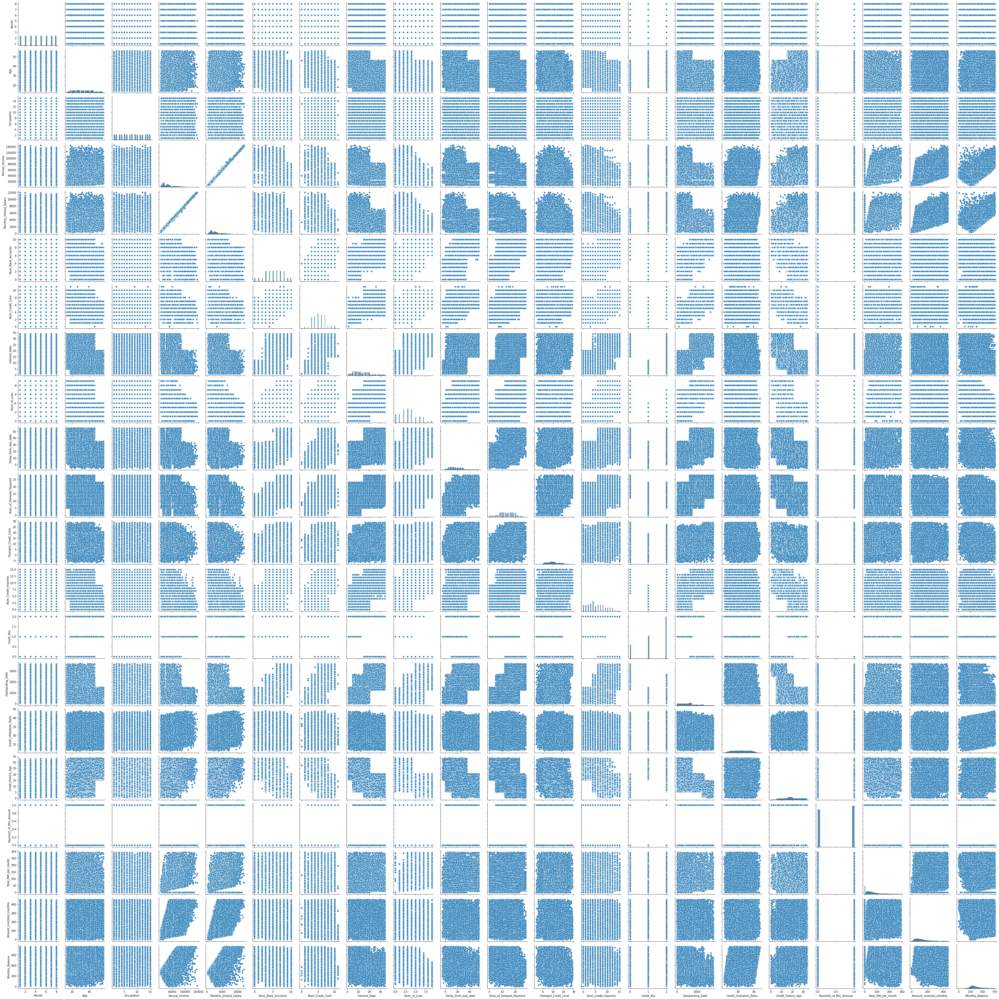

In [9]:
sns.pairplot(final)

In [5]:
final.drop(columns=['Type_of_Loan'],axis=1,inplace=True)

In [6]:
final.dropna(inplace=True)
final.isna().sum()
final.shape

(61934, 27)

Model Prediction

In [7]:
X = final.drop(columns=["ID","Customer_ID","Name","SSN","Monthly_Inhand_Salary","Monthly_Balance","Payment_Behaviour","Credit_Score"],axis=1)
Y = final["Credit_Score"]

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3)

In [11]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape, 

((43353, 19), (18581, 19), (43353,), (18581,))

In [8]:
X_train.describe()

,Month,Age,Occupation,Annual_Income,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly
count,43353.000000,43353.000000,43353.000000,43353.000000,43353.000000,43353.000000,43353.000000,43353.000000,43353.000000,43353.000000,43353.000000,43353.000000,43353.000000,43353.000000,43353.000000,43353.000000,43353.000000,43353.000000,43353.000000
mean,4.538855,33.408438,7.961894,37464.198973,5.256684,5.413674,14.029963,3.309875,19.170738,13.138346,9.854056,5.446636,1.363251,1217.025966,32.034450,19.075596,0.521809,73.253204,141.223887
std,2.274681,10.833849,4.329224,24386.715698,2.495565,1.981898,8.398939,2.216283,12.473887,5.916795,5.992520,3.642230,0.758502,841.882659,5.004881,7.894714,0.499530,66.803544,97.698794
min,1.000000,14.000000,1.000000,7005.930000,0.000000,0.000000,1.000000,0.000000,-5.000000,0.000000,-6.490000,0.000000,0.000000,0.230000,21.301197,0.083333,0.000000,0.000000,0.000000
25%,3.000000,25.000000,4.000000,18097.460000,3.000000,4.000000,7.000000,2.000000,10.000000,9.000000,5.380000,3.000000,1.000000,545.130000,27.840732,13.250000,0.000000,24.413347,68.077218
50%,5.000000,33.000000,8.000000,31732.610000,5.000000,5.000000,12.000000,3.000000,17.000000,13.000000,9.300000,5.000000,2.000000,1112.570000,32.042949,18.750000,1.000000,52.943493,114.637696
75%,7.000000,42.000000,12.000000,50739.270000,7.000000,7.000000,19.000000,5.000000,26.000000,18.000000,13.810000,8.000000,2.000000,1661.550000,36.264825,25.416667,1.000000,102.796309,188.315750
max,8.000000,56.000000,15.000000,145175.400000,10.000000,11.000000,34.000000,9.000000,55.000000,28.000000,28.930000,15.000000,2.000000,3650.330000,43.947467,33.666667,1.000000,293.318317,455.773475


In [13]:
# from sklearn.svm import SVC

# svm = SVC(kernel='linear', C=1.0)
# svm.fit(X_train, y_train)

# y_pred = svm.predict(X_test)

# accuracy = classification_report(y_test, y_pred)
# print(f"Accuracy for Support Vector Machine Classifier is {accuracy:.3f}")

In [13]:
from sklearn.neighbors import KNeighborsClassifier
knn_3 = KNeighborsClassifier(n_neighbors=3)
knn_5 = KNeighborsClassifier(n_neighbors=5)
knn_10 = KNeighborsClassifier(n_neighbors=10)

In [16]:
X_train.shape

(43353, 19)

In [14]:
knn_3.fit(X_train, y_train)
knn_5.fit(X_train, y_train)
knn_10.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=10)

In [15]:
y_pred_3 = knn_3.predict(X_test)
y_pred_5 = knn_5.predict(X_test)
y_pred_10 = knn_10.predict(X_test)
print(classification_report(y_test,y_pred_3))
print(classification_report(y_test,y_pred_5))
print(classification_report(y_test,y_pred_10))

              precision    recall  f1-score   support

        Good       0.84      0.85      0.84      3615
        Poor       0.94      0.93      0.93      5942
    Standard       0.92      0.92      0.92      9024

    accuracy                           0.91     18581
   macro avg       0.90      0.90      0.90     18581
weighted avg       0.91      0.91      0.91     18581

              precision    recall  f1-score   support

        Good       0.76      0.77      0.76      3615
        Poor       0.89      0.88      0.88      5942
    Standard       0.86      0.87      0.87      9024

    accuracy                           0.85     18581
   macro avg       0.84      0.84      0.84     18581
weighted avg       0.85      0.85      0.85     18581

              precision    recall  f1-score   support

        Good       0.60      0.63      0.61      3615
        Poor       0.78      0.80      0.79      5942
    Standard       0.78      0.75      0.76      9024

    accuracy        

In [18]:
print(confusion_matrix(y_test,y_pred_3))

[[3072   85  458]
 [ 132 5503  307]
 [ 460  254 8310]]


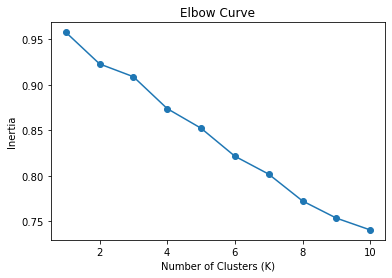

In [23]:
# Calculate inertia for different values of K
# from sklearn.base import accuracy_score
inertia = []
k_values = []
accuracy_values = []
for k in range(1, 11):
    knn_model = KNeighborsClassifier(n_neighbors=k)
    knn_model.fit(X_train, y_train)
    
    # Make predictions on the test set
    y_pred = knn_model.predict(X_test)
    
    # Calculate accuracy and store k and accuracy values
    accuracy = accuracy_score(y_test, y_pred)
    k_values.append(k)
    accuracy_values.append(accuracy)

    # knn_3 = KNeighborsClassifier(n_neighbors=3)
    # knn_3.fit(X_train, y_train)
    
    # # kmeans = KMeans(n_clusters=k, random_state=12)
    # # kmeans.fit(X)
    # inertia.append(kmeans.inertia_)

# Plot the elbow curve
plt.plot(range(1, 11), accuracy_values, marker='o')
plt.title('Elbow Curve')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Inertia')
plt.show()

In [13]:
from sklearn.linear_model import LogisticRegression

In [14]:
logit = LogisticRegression(max_iter=1000)
logit.fit(X_train,y_train)
logit_pred=logit.predict(X_test)

print(classification_report(y_test,logit_pred))

/Users/krutinrahtod/Desktop/Desktop/WEB/webCodes/pyCode/miniconda/test_project/env/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


              precision    recall  f1-score   support

        Good       0.57      0.49      0.53      3543
        Poor       0.76      0.63      0.69      5899
    Standard       0.67      0.78      0.72      9139

    accuracy                           0.68     18581
   macro avg       0.67      0.63      0.65     18581
weighted avg       0.68      0.68      0.67     18581



In [15]:
from sklearn.cluster import KMeans

num_clusters = 3  # Data set has 3 type of credit score
kmeans = KMeans(n_clusters=num_clusters, random_state=12)
kmeans.fit(X)
labels = kmeans.labels_
centers = kmeans.cluster_centers_
df_cluster=pd.DataFrame({'Actual':Y,'Cluster':labels})
# Create a cross-tabulation
cross_tab = pd.crosstab(df_cluster['Actual'], df_cluster['Cluster'])

print(cross_tab)

from sklearn.metrics import silhouette_score
silhouette_avg = silhouette_score(X, labels)
silhouette_avg

Cluster       0     1      2
Actual                      
Good       3469  3226   5326
Poor      10141  3100   6701
Standard  12411  7156  10404


KeyboardInterrupt: 

In [16]:
from sklearn.naive_bayes import CategoricalNB, GaussianNB

nb_cat = CategoricalNB()
nb_cat.fit(X_train, y_train)
y_pred = nb_cat.predict(X_test)

print(classification_report(y_test,y_pred))

ValueError: Negative values in data passed to CategoricalNB (input X)

In [17]:
from sklearn.naive_bayes import GaussianNB

model_naive = GaussianNB()
model_naive.fit(X_train, y_train)
y_pred = model_naive.predict(X_test)

print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

        Good       0.50      0.82      0.62      3543
        Poor       0.78      0.71      0.75      5899
    Standard       0.82      0.66      0.73      9139

    accuracy                           0.71     18581
   macro avg       0.70      0.73      0.70     18581
weighted avg       0.75      0.71      0.72     18581



In [9]:
from sklearn.ensemble import RandomForestClassifier

# Train the model
model = RandomForestClassifier()
model.fit(X_train, y_train)

# Predictions on the test set
y_pred = model.predict(X_test)

class_report = classification_report(y_test, y_pred)
print("Classification Report:\n",class_report)

Classification Report:
               precision    recall  f1-score   support

        Good       0.98      0.98      0.98      3543
        Poor       0.99      0.99      0.99      5899
    Standard       0.99      0.99      0.99      9139

    accuracy                           0.99     18581
   macro avg       0.99      0.98      0.98     18581
weighted avg       0.99      0.99      0.99     18581



In [12]:
from sklearn.tree import DecisionTreeClassifier
model = DecisionTreeClassifier()
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

class_report = classification_report(y_test, y_pred)
print("Classification Report:\n",class_report)

Classification Report:
               precision    recall  f1-score   support

        Good       0.93      0.93      0.93      3543
        Poor       0.95      0.96      0.95      5899
    Standard       0.97      0.96      0.96      9139

    accuracy                           0.95     18581
   macro avg       0.95      0.95      0.95     18581
weighted avg       0.95      0.95      0.95     18581

